In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from osgeo import gdal

In [2]:
import pandas as pd
import seaborn as sns

import os
from os import listdir

In [3]:
getty_landscape = gdal.Open('landscapeAnalysis/USGS_one_meter_x36y378_CA_LosAngeles_2016.tif')
band1_getty = getty_landscape.GetRasterBand(1)
b1_getty = band1_getty.ReadAsArray()
UE_selected = b1_getty[5000:8500,2000:5500]

In [10]:
import math
def elevation_calc(x):
    return (x + 12800)/70.44246535971129 + 153.0624
def raster_k(X_pixel, hFOV):
    return math.tan(math.radians(hFOV * (X_pixel - 1920/2)/1920))
def beam_k(X_pixel, vFOV):
    return math.tan(math.radians(vFOV * (X_pixel - 1080/2)/1080))
def beam_k_p(X_pixel, vFOV, p):
    return math.tan(math.radians(vFOV * (X_pixel - 1080/2)/1080 + p))

In [4]:
def topo_Depth_C(X_pixel, Y_pixel, X_raster, Y_raster, vFOV, hFOV, pitch, elevation):

    elev_cam = elevation_calc(elevation)
    k_r = raster_k(X_pixel,vFOV)
    k_b = beam_k_p(Y_pixel, hFOV, pitch)
    d_b = elev_cam - k_b*X_raster
    d_r = Y_raster - k_r*X_raster
    for i in range(0, 1200):
        x = X_raster - i
        y = math.floor(k_r*x+d_r)
        view_elevation = k_b * x + d_b
        #print(x, y, img[y][x])
        #print(x, y, UE_selected[y][x],view_elevation)
        #elevation_array.append(img[y][x])
        #number_bin.append(x)
        #elevation_array.append(UE_selected[y][x])
        #number_bin.append(x)
        if (view_elevation < UE_selected[y][x]):      
            print(x, y, UE_selected[y][x],view_elevation)
            return x,y
    return -1, -1

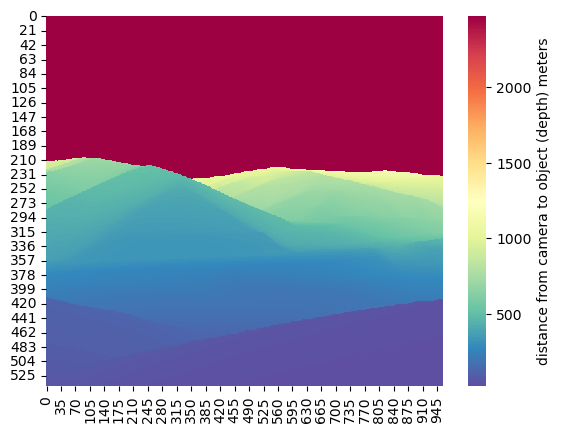

In [28]:
ax = sns.heatmap(depth_map, cbar_kws={'label': 'distance from camera to object (depth) meters'}, cmap=sns.color_palette("Spectral_r", as_cmap=True))
fig = ax.get_figure()
fig.savefig('VideoAnalytics/FireLocDepthMapping')

In [15]:
d_m = np.array(depth_map)

In [16]:
d_m[d_m > 2000] = -1

In [ ]:
pixel_Y = random.randint(400,1079)
pixel_X = random.randint(100,1800)

In [7]:
import math

In [26]:
depth_map = []
for pixel_Y in range(0, a_max,2):
    dm_row = []
    for pixel_X in range(0, b_max, 2):
        cam_X = 2100  #+ random.random()*5
        cam_Y = 1300 #+ random.random()*5
        pred_X, pred_Y = topo_Depth_C(pixel_X, pixel_Y, 2100, 1300, 58.224674, 89.424164, 0, -2200.625)
        diff_X = pred_X - 2100
        diff_Y = pred_Y - 1300
        dist = math.sqrt(diff_X * diff_X + diff_Y * diff_Y)
        dm_row.append(dist)
    depth_map.append(dm_row)

1344 1634 445.1067 444.99091023747553
1345 1633 444.9114 444.80379387629216
1347 1631 444.44608 444.4295611539254
1348 1630 444.27707 444.2424447927421
1349 1628 444.07983 444.0553284315588
1349 1627 444.07172 444.0553284315588
1349 1627 444.07172 444.0553284315588
1344 1628 445.04138 444.99091023747553
1337 1630 446.33798 446.300724765759
1333 1631 447.15543 447.0491902104924
1326 1633 448.40567 448.35900473877587
1348 1637 442.19363 441.9940718824596
1351 1635 441.52814 441.4416923716899
1353 1633 441.11703 441.07343936451014
1353 1632 441.35727 441.07343936451014
1354 1631 441.04828 440.88931286092026
1355 1630 440.73276 440.7051863573304
1356 1628 440.69458 440.52105985374044
1356 1627 440.8478 440.52105985374044
1358 1625 440.26733 440.1528068465607
1359 1624 439.9709 439.9686803429708
1363 1621 439.2558 439.2321743286112
1363 1620 439.3732 439.2321743286112
1363 1620 439.3732 439.2321743286112
1360 1620 439.96484 439.7845538393809
1358 1620 440.34766 440.1528068465607
1357 1619 4

In [6]:
img = cv2.imread('VideoAnalytics/camera11_fire/fire10.jpg')
print(img.shape)
a_max, b_max, _ = img.shape

(1080, 1920, 3)
